In [304]:
import os
import sys
import urllib, io
os.getcwd()
sys.path.append("..")
sys.path.append("../utils")
proj_dir = os.path.abspath('../..')

## add helpers to python path
if os.path.join(proj_dir,'stimuli') not in sys.path:
    sys.path.append(os.path.join(proj_dir,'stimuli'))

import numpy as np
import scipy.stats as stats
import pandas as pd
from scipy import stats
from scipy.spatial import distance
from scipy import ndimage
from scipy.stats import entropy
from random import random
from sklearn.cluster import SpectralBiclustering
import sklearn.metrics as metrics
import itertools

import pymongo as pm
from collections import Counter
import json
import re
import ast

from PIL import Image, ImageOps, ImageDraw, ImageFont 

from io import BytesIO
import base64

import  matplotlib
from matplotlib import pylab, mlab, pyplot
%matplotlib inline
from IPython.core.pylabtools import figsize, getfigs
plt = pyplot
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
from matplotlib import colors

import seaborn as sns
sns.set_context('talk')
sns.set_style('darkgrid')

from IPython.display import clear_output

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

import plotly
import plotly.graph_objects as go
import plotly.io as pio
pio.orca.config.use_xvfb = False
plotly.io.orca.config.save()

import importlib
import trajectory as g

import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/wmccarth/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [66]:
## directory & file hierarchy
proj_dir = os.path.abspath('../..')
datavol_dir = os.path.join(proj_dir,'data')
analysis_dir = os.path.abspath(os.path.join(os.getcwd(),'..'))
results_dir = os.path.join(analysis_dir,'results')
stim_dir = os.path.join(proj_dir,'stimuli')
plot_dir = os.path.join(results_dir,'plots')
csv_dir = os.path.join(results_dir,'csv')
json_dir = os.path.join(results_dir,'json')
exp_dir = os.path.abspath(os.path.join(proj_dir,'experiments'))
png_dir = os.path.abspath(os.path.join(datavol_dir,'png'))
jefan_dir = os.path.join(analysis_dir,'jefan')
will_dir = os.path.join(analysis_dir,'will')
    
if not os.path.exists(results_dir):
    os.makedirs(results_dir)
    
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)   
    
if not os.path.exists(csv_dir):
    os.makedirs(csv_dir)       

# Human Data

### load in data

In [26]:
iteration_name = 'Exp2Pilot3_all'
num_trials = 24 #for sanity checks

In [27]:
# Data already compiled into dataframes in CogSci 2020 Dataframe Generator

# trial_end data
trial_path = os.path.join(csv_dir,'block_silhouette_{}_good.csv'.format(iteration_name))
df = pd.read_csv(trial_path)

# # initial_block data
initial_path = os.path.join(csv_dir,'block_silhouette_initial_{}_good.csv'.format(iteration_name))
dfi = pd.read_csv(initial_path)

# # settled_block data
settled_path = os.path.join(csv_dir,'block_silhouette_settled_{}_good.csv'.format(iteration_name))
dfs = pd.read_csv(settled_path)

# # Sanity Check- same participants in each dataset.
df_participants = df.gameID.unique()
dfs_participants = dfs.gameID.unique()
assert Counter(df_participants) == Counter(dfs_participants)

n_before_outliers = len(df_participants)
print(str(n_before_outliers) + ' participants total')

105 participants total


### apply preprocessing

In [28]:
targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())

dfi['usableDiscreteWorld'] = dfi['discreteWorld'].apply(lambda a: 1+(-1)*np.array(ast.literal_eval(a)))
dfi['flatDiscreteWorld'] = dfi['discreteWorld'].apply(lambda a: (1+(-1)*np.array(ast.literal_eval(a))).flatten())

dfic = dfi.copy()
#dfic = dfi[dfi.condition=='repeated']
dfic = dfic[['targetName','gameID','blockNum','repetition','phase_extended','flatDiscreteWorld','usableDiscreteWorld','rawF1DiscreteScore']]
dfic['discreteWorld'] = dfic['usableDiscreteWorld']
dfic['flatDiscreteWorldStr'] = dfic['flatDiscreteWorld'].apply(g.convert_to_str)

max_actions = dfic['blockNum'].max()

In [6]:
dfic

,targetName,gameID,blockNum,repetition,phase_extended,flatDiscreteWorld,usableDiscreteWorld,rawF1DiscreteScore,discreteWorld,flatDiscreteWorldStr
0,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,1,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.266667,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
1,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,2,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.470588,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
2,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,3,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.555556,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
3,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,4,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.700000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
4,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,5,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.772727,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
5,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,1,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.266667,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
6,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,2,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.375000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
7,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,3,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.424242,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
8,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,4,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.470588,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
9,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,5,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.514286,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...


### make trajectory graph

In [34]:
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = ['pre', 'post']
    for this_target in targets:
        for this_phase in phases:
            g.plot_trajectory_graph(data = dfic, 
                                    target_name = this_target, 
                                    phase = this_phase, 
                                    save = False, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.4,
                                    node_size_scale_factor = 0.4)

../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/Users/will/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = ['pre', 'post']
    for this_target in targets[2:3]:
        for this_phase in phases:
            g.plot_trajectory_graph(data = dfic, 
                                    target_name = this_target, 
                                    phase = this_phase, 
                                    save = True, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.5,
                                    node_size_scale_factor = 0.5)

### analyze sparsity over world states

In [187]:
importlib.reload(g)
H = dict()
P = dict()
W = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    W[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p,w = g.get_sparsity_over_states(data=dfic, target=target, phase=phase, metric='mean')
        H[target][phase] = h
        P[target][phase] = p
        W[target][phase] = w
        clear_output(wait=True)
print('Done!')

Done!


In [141]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in state visits in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean state visits in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in state visits in each phase**
Original mean = 0.39394. Bootstrapped mean = 0.38947.
95% CI = [0.22909, 0.55502].
p<0=0.0 | p>0=2.0.
t(7) = 4.2279 | p = 0.0039
-------
**Mean state visits in each phase**
pre
Original mean = 2.04344. Bootstrapped mean = 2.04415.
95% CI = [1.87586, 2.2075].
post
Original mean = 2.43738. Bootstrapped mean = 2.43362.
95% CI = [2.17349, 2.6703].


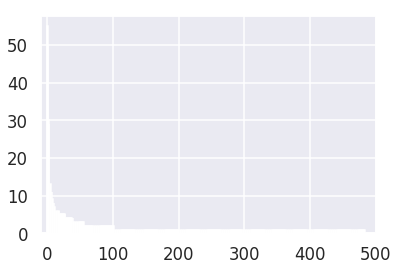

In [213]:
a = list(W[targets[0]]['pre'].values())
a.sort()
a.reverse()
f = plt.figure()
plt.bar(height=a,x=range(len(a)),color='black')
plt.xlim((-10,500))
plt.show()

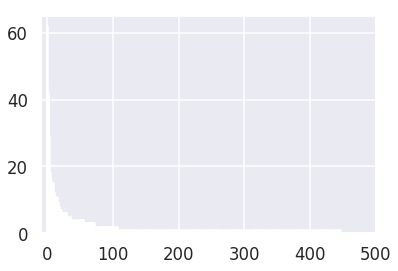

In [204]:
a = list(W[targets[0]]['post'].values())
a.sort()
a.reverse()
f = plt.figure()
plt.bar(height=a,x=range(len(a)), color='blue')
plt.xlim((-10,500))
plt.show()

### Analyze set relationships between pre states and post states

In [44]:
NS = dict() # num states dict
for target in targets:
    NS[target] = dict()
    PRE = set(P[target]['pre'].keys())
    POST = set(P[target]['post'].keys())
    xsect = PRE.intersection(POST)
    u = PRE.union(POST)
    overlap = list(xsect)
    post_prop = np.sum([P[target]['post'][o] for o in overlap])
    pre_prop = np.sum([P[target]['pre'][o] for o in overlap])    
    NS[target]['pre'] = len(PRE)
    NS[target]['post'] = len(POST)
    NS[target]['xsect'] = len(xsect)
    NS[target]['union'] = len(u)
    NS[target]['pre_overlap'] = pre_prop
    NS[target]['post_overlap'] = post_prop   
    NS[target]['diff'] = len(POST) - len(PRE)
    print('{} | Pre: {} | Post: {} | Intrsct: {} | Union: {} | PreOverlap: {} | PostOverlap: {}'.
          format(target, len(PRE),len(POST),len(xsect), len(u), pre_prop.round(4),post_prop.round(4)))

## create num states dataframe 
ND = pd.DataFrame.from_dict(NS, orient='index').reset_index()    

hand_selected_004 | Pre: 484 | Post: 448 | Intrsct: 134 | Union: 798 | PreOverlap: 0.5756 | PostOverlap: 0.6641
hand_selected_005 | Pre: 324 | Post: 332 | Intrsct: 92 | Union: 564 | PreOverlap: 0.6697 | PostOverlap: 0.7027
hand_selected_006 | Pre: 426 | Post: 479 | Intrsct: 110 | Union: 795 | PreOverlap: 0.545 | PostOverlap: 0.5443
hand_selected_008 | Pre: 423 | Post: 363 | Intrsct: 96 | Union: 690 | PreOverlap: 0.5681 | PostOverlap: 0.7021
hand_selected_009 | Pre: 442 | Post: 359 | Intrsct: 114 | Union: 687 | PreOverlap: 0.6225 | PostOverlap: 0.7401
hand_selected_011 | Pre: 383 | Post: 393 | Intrsct: 102 | Union: 674 | PreOverlap: 0.6292 | PostOverlap: 0.662
hand_selected_012 | Pre: 439 | Post: 453 | Intrsct: 152 | Union: 740 | PreOverlap: 0.6795 | PostOverlap: 0.7026
hand_selected_016 | Pre: 549 | Post: 559 | Intrsct: 181 | Union: 927 | PreOverlap: 0.5782 | PostOverlap: 0.6109


In [25]:
ND

,index,pre,post,xsect,union,pre_overlap,post_overlap,diff
0,hand_selected_004,484,448,134,798,0.575588,0.664093,-36
1,hand_selected_005,324,332,92,564,0.669701,0.702671,8
2,hand_selected_006,426,479,110,795,0.544959,0.544304,53
3,hand_selected_008,423,363,96,690,0.568098,0.702062,-60
4,hand_selected_009,442,359,114,687,0.622503,0.740076,-83
5,hand_selected_011,383,393,102,674,0.629187,0.662014,10
6,hand_selected_012,439,453,152,740,0.679474,0.702582,14
7,hand_selected_016,549,559,181,927,0.578174,0.610856,10


In [45]:
## difference in total num states visited between pre and post
importlib.reload(g)
g.statsPrint(ND['diff'].values)

t(7) = -0.66004 | p = 0.53034
Original mean = -10.5. Bootstrapped mean = -9.88538.
95% CI = [-38.3875, 18.4].
p<0=1.444 | p>0=0.554.


### calculate sparsity over state-state transitions

In [27]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity for {} {}'.format(target, phase))
        h, E = g.get_sparsity_over_edges(data=dfic, target=target, phase=phase, metric='mean')
        H[target][phase] = h
        P[target][phase] = E
        clear_output(wait=True)
print('Done!')   

Done!


In [28]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in state-state transitions taken in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean state-state transitions taken in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in state-state transitions taken in each phase**
Original mean = 0.29713. Bootstrapped mean = 0.29402.
95% CI = [0.17107, 0.42691].
p<0=0.0 | p>0=2.0.
t(7) = 3.98253 | p = 0.00531
-------
**Mean state-state transitions taken in each phase**
pre
Original mean = 1.74183. Bootstrapped mean = 1.74255.
95% CI = [1.62498, 1.86782].
post
Original mean = 2.03895. Bootstrapped mean = 2.03657.
95% CI = [1.84511, 2.21374].


## Gini coefficient

#### Nodes

In [21]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p = g.get_sparsity_over_states(data=dfic, target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Done!


In [23]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in Gini coefficient in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in Gini coefficient in each phase**
Original mean = 0.07242. Bootstrapped mean = 0.07172.
95% CI = [0.04812, 0.09686].
p<0=0.0 | p>0=2.0.
t(7) = 5.29596 | p = 0.00113
-------
**Mean Gini coefficient in each phase**
pre
Original mean = 0.45975. Bootstrapped mean = 0.45978.
95% CI = [0.4227, 0.49455].
post
Original mean = 0.53217. Bootstrapped mean = 0.5315.
95% CI = [0.48502, 0.5717].


#### Edges

In [127]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p = g.get_sparsity_over_edges(data=dfic, target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Done!


In [128]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in Gini coefficient in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in Gini coefficient in each phase**
Original mean = 0.07306. Bootstrapped mean = 0.07238.
95% CI = [0.04642, 0.1004].
p<0=0.0 | p>0=2.0.
t(7) = 4.88012 | p = 0.00179
-------
**Mean Gini coefficient in each phase**
pre
Original mean = 0.38978. Bootstrapped mean = 0.38994.
95% CI = [0.35619, 0.42524].
post
Original mean = 0.46284. Bootstrapped mean = 0.46232.
95% CI = [0.4194, 0.50172].


# Random Agent

In [306]:
# Load in all 1000 batches of 105 agent runs

import glob
import re

in_path = os.path.join(csv_dir,'agent_results/')

all_files = glob.glob(in_path + "/*thread_*complete.csv")
len([print(file) for file in all_files])
li = []

for filename in all_files:
    batch = pd.read_csv(filename, index_col=None, header=0)
    li.append(batch)

dfra = pd.concat(li, axis=0, ignore_index=True)

dfra['phase_extended'] = 'simulate'
dfra['gameID'] = dfra.runID

targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())


dfra['discreteWorld'] = dfra['discreteWorld'].apply(lambda a: np.array(ast.literal_eval(re.sub("\s+", ",", a.strip()))))
dfra['flatDiscreteWorld'] = dfra['discreteWorld'].apply(lambda a: a.flatten())
dfra['flatDiscreteWorldStr'] = dfra['flatDiscreteWorld'].apply(g.convert_to_str)

max_actions = dfra['blockNum'].max()




ValueError: No objects to concatenate

In [44]:
dfra.groupby(['batch']).agg(lambda f: f['runID'].nunique())

,Unnamed: 0,targetName,run,runID,blockNum,discreteWorld,perfect,x,y,w,h,rawF1DiscreteScore,phase_extended,gameID,flatDiscreteWorld,flatDiscreteWorldStr
batch,,,,,,,,,,,,,,,,
0ac6f3d4-9a21-11ea-8478-3bbda9c72c57,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
0ac6fc58-9a21-11ea-b47e-55bb06e98712,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
0bb3bc82-9a21-11ea-8478-3bbda9c72c57,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
0bc019a0-9a21-11ea-b47e-55bb06e98712,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
0ccc4f94-9a21-11ea-8478-3bbda9c72c57,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
0ccf9082-9a21-11ea-b47e-55bb06e98712,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40


In [263]:
# subset of data loaded - not used for actual analyses
# Instead of this, use each batch id as a run of 105 participants

if False:

    importlib.reload(g)
    H = dict()
    P = dict()
    niter = 1
    for target in targets:
        subset = dfra[(dfra.targetName==target)&(dfra.blockNum==0)]['runID']
        H[target] = dict()
        P[target] = dict()
        for i in range(niter):
            sample_ids = list(subset.sample(105))
            sample = dfra[dfra.runID.isin(sample_ids)]
            print('Calculating sparsity metric for {} iter {}'.format(target, i))
            h,p,w = g.get_sparsity_over_states(data=sample, target=target, phase='simulate', metric='gini')
            H[target][i] = h
            P[target][i] = p
            clear_output(wait=True)
    print('Done!')

Done!


In [ ]:
H2 = pd.DataFrame(H).transpose().reset_index()
importlib.reload(g)
print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on Gini coefficient of state visits in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

#### States

In [ ]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['simulate']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p,w = g.get_sparsity_over_states(data=dfra[0:105], target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

In [ ]:
H2 = pd.DataFrame(H).transpose().reset_index()
importlib.reload(g)
print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on Gini coefficient of state visits in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

#### Edges

In [130]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['simulate']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p = g.get_sparsity_over_edges(data=dfra, target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Done!


In [131]:
H2 = pd.DataFrame(H).transpose().reset_index()
importlib.reload(g)
print('-------')
print('**Mean Gini coefficient for edge traversals in each phase**')
## bootstrapped CIs on Gini coefficient for edge traversals in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

-------
**Mean Gini coefficient for edge traversals in each phase**
simulate
Original mean = 0.64176. Bootstrapped mean = 0.64356.
95% CI = [0.57517, 0.71664].


In [47]:
# sample 105 and create figures
# not used for actual paper, instead used one dataframe of 105 participants

if False:

    phase_alias = 'random agent'

    dfra['phase_extended'] = phase_alias

    sample_size = 105
    importlib.reload(g) ## reimport graph utils
    make_plot = True
    if make_plot:
        phases = [phase_alias]
        for target in [targets[0]]:
            target_ids = dfra[(dfra.targetName==target) & (dfra.blockNum==0)]['runID']
            sample_ids = list(target_ids.sample(sample_size))
            sample = dfra[(dfra.targetName==target) & (dfra.runID.isin(sample_ids))]
            for this_phase in phases:
                g.plot_trajectory_graph(data = sample, 
                                        target_name = target, 
                                        phase = this_phase, 
                                        save = True, 
                                        out_dir = plot_dir,
                                        extension = 'test',
                                        x_lower_bound = 4,
                                        x_upper_bound = 13,
                                        edge_width_scale_factor = 0.4,
                                        node_size_scale_factor = 0.4,
                                        colors = ["#1c373e","#1c373e"])

../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/Users/will/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



In [9]:
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = ['simulation']
    for this_target in targets:
        for this_phase in phases:
            g.plot_trajectory_graph(data = dfra, 
                                    target_name = this_target, 
                                    phase = this_phase, 
                                    save = False, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.4,
                                    node_size_scale_factor = 0.4)

../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/home/wmccarth/anaconda3/envs/py35/lib/python3.5/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



## ngram analysis of world states

In [ ]:
# Distributions of Gini coefficients for ngrams

In [71]:
def add_ngrams_to_dict(world_states, n, counts):
    n_grams = nltk.ngrams(world_states, n)
    for grams in n_grams:
        counts[' '.join(grams)] = counts.get(' '.join(grams), 0) + 1

def gini_coefficient(visits):
    visits = np.array(visits)[:,None]
    numerator = np.sum(metrics.pairwise_distances(visits))
    denomenator = 2 * (len(visits)**2) * np.mean(visits)
    if denomenator == 0:
        g = 0
    else:
        g = numerator/denomenator
    return g

In [190]:
# Load agent data from 1000 dataframes, each with 105 agent runs (to match number of ppts)

import glob
import re

in_path = os.path.join(csv_dir,'agent_results/1000')

all_files = glob.glob(in_path + "/*complete_*.csv")
#len([print(file) for file in all_files])


li = []

for filename in all_files:
    batch = pd.read_csv(filename, index_col=None, header=0)
    li.append(batch)
    
dfra = pd.concat(li, axis=0, ignore_index=True)

dfra['phase_extended'] = 'simulate'
dfra['gameID'] = dfra.runID

targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())


dfra['phase_extended'] = 'simulation'
dfra['gameID'] = dfra.runID

# String operations take a long time- next time consider putting each cell of discreteWorld into an individual column
dfra['discreteWorld'] = dfra['discreteWorld'].apply(lambda a: np.array(ast.literal_eval(re.sub("\s+", ",", a.strip()))))
dfra['flatDiscreteWorld'] = dfra['discreteWorld'].apply(lambda a: a.flatten())
dfra['flatDiscreteWorldStr'] = dfra['flatDiscreteWorld'].apply(g.convert_to_str)

In [195]:
save_data = False

if save_data:
    out_path = os.path.join(csv_dir,'agent_results/block_silhouette_initial_random_agent_all_agents_usable.csv')  

    dfra.to_csv(out_path)

In [200]:
# Batch method- each 'batch' is 105 runs

targets = np.sort(dfra['targetName'].unique())
nppts = 105
results = pd.DataFrame(columns=['targetName','batch','gini'])
group_size = 20
n_group = 50

In [201]:
# Calculate gini index for each structure in each batch, saving dataframes as you go

for i in range(0,n_group):
    print('running agents {} to {}'.format(group_size*i,group_size*(i+1)-1))
    batches = np.sort(dfra['batch'].unique())[group_size*i:group_size*(i+1)]
    G = {}
    for target in targets:
        G[target] = {}
        for b in batches:
            G[target][b] = {}
            df_batch = dfra[(dfra.targetName==target) & (dfra.batch==b)]
            for n in range(1,11):
                counts = {}
                df_batch.groupby(['runID'])['flatDiscreteWorldStr']\
                            .agg(lambda ws: add_ngrams_to_dict(list(ws),n,counts))
                visits = list(counts.values())
                G[target][b][n] = gini_coefficient(visits)


    for target in targets:
        target_df = pd.DataFrame.from_dict(G[target],orient='index')
        target_df.columns = target_df.columns.map(lambda x: 'gini'+str(x))
        target_df['batch'] = target_df.index
        target_df = pd.wide_to_long(target_df, stubnames='gini', i=['batch'], j='nlevel')
        target_df['targetName'] = target
        target_df = target_df.reset_index()
        results = results.append(target_df,sort=False)
        results['phase'] = 'random agent'
        group_path = os.path.join(csv_dir,'agent_results/tmp/block_silhouette_{}_ngram_agent_results_group_{}.csv'.format(iteration_name,str(i)))
        target_df.to_csv(group_path)
        agent_results_path = os.path.join(csv_dir,'agent_results/block_silhouette_{}_ngram_agent_results.csv'.format(iteration_name))
        results.to_csv(agent_results_path)


running agents 0 to 19
running agents 20 to 39
running agents 40 to 59
running agents 60 to 79
running agents 100 to 119
running agents 120 to 139
running agents 140 to 159
running agents 160 to 179
running agents 180 to 199
running agents 200 to 219
running agents 220 to 239
running agents 240 to 259
running agents 260 to 279
running agents 280 to 299
running agents 300 to 319
running agents 320 to 339
running agents 340 to 359
running agents 360 to 379
running agents 380 to 399
running agents 400 to 419
running agents 420 to 439
running agents 440 to 459
running agents 460 to 479
running agents 480 to 499
running agents 500 to 519
running agents 520 to 539
running agents 540 to 559
running agents 560 to 579
running agents 580 to 599
running agents 600 to 619
running agents 620 to 639
running agents 640 to 659
running agents 660 to 679
running agents 680 to 699
running agents 700 to 719
running agents 720 to 739
running agents 740 to 759
running agents 760 to 779
running agents 780 to

In [204]:
results2 = results.copy()

In [163]:
Check each nlevel has 8*10 values (8 structures, 10 levels)

results.groupby(['nlevel']).agg(len)

,targetName,batch,gini,phase
nlevel,,,,
1.0,80,80,80.0,80
2.0,80,80,80.0,80
3.0,80,80,80.0,80
4.0,80,80,80.0,80
5.0,80,80,80.0,80
6.0,80,80,80.0,80
7.0,80,80,80.0,80
8.0,80,80,80.0,80
9.0,80,80,80.0,80


In [ ]:
save_data = False

if save_data:
    out_path = os.path.join(csv_dir,'block_silhouette_{}_ngram_agent_results_group_.csv'.format(iteration_name,i))
    results.to_csv(out_path)

### human results

In [97]:
results_h = pd.DataFrame(columns=['targetName','phase','gini'])

G = {}
for target in targets:
    G[target] = {}
    for phase in ['pre','post']:
        G[target][phase] = {}
        df_phase = dfic[(dfic.targetName==target) & (dfic.phase_extended==phase)]
        for n in range(1,11):
            counts = {}
            df_phase.groupby(['gameID'])['flatDiscreteWorldStr']\
                        .agg(lambda ws: add_ngrams_to_dict(list(ws),n,counts))
            visits = list(counts.values())
            G[target][phase][n] = gini_coefficient(visits)

#     target_df = pd.DataFrame.from_dict(G[target])
#     target_df['n'] = target_df.index
#     target_df = target_df.melt()\
#                         .rename(columns={'variable':'iter','value':'gini'})
    
#     target_df['targetName'] = target
#     results = results.append(this,sort=False)
            
for target in targets:
    target_df = pd.DataFrame.from_dict(G[target],orient='index')
    target_df.columns = target_df.columns.map(lambda x: 'gini'+str(x))
    target_df['phase'] = target_df.index
    target_df = pd.wide_to_long(target_df, stubnames='gini', i=['phase'], j='nlevel')
    target_df['targetName'] = target
    target_df = target_df.reset_index()
    results_h = results_h.append(target_df,sort=False)

In [213]:
results_h['human'] = True
results['human'] = False

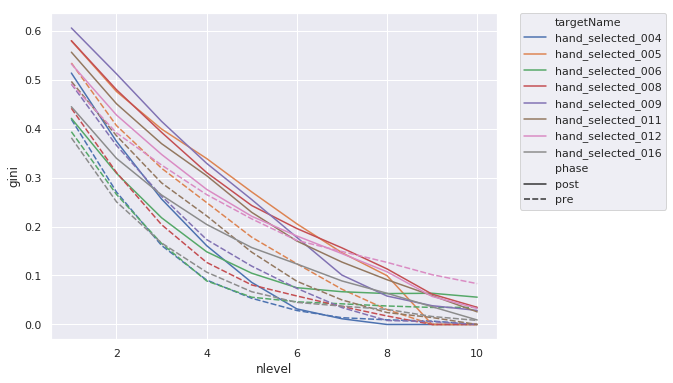

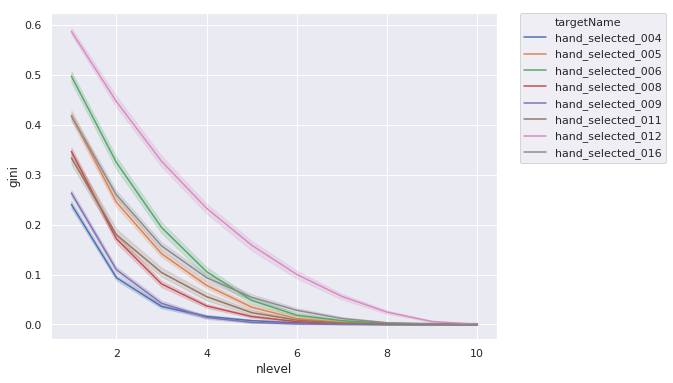

In [106]:
# Plot gini across nlevel for each structure

sns.set(rc={'figure.figsize':(8,6)})
plt.figure()
sns.lineplot(data=results_h, x='nlevel', y='gini', style='phase', hue='targetName')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

sns.set(rc={'figure.figsize':(8,6)})
plt.figure()
sns.lineplot(data=results, x='nlevel', y='gini', hue='targetName')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.set(rc={'figure.figsize':(10,10)})


### comparison

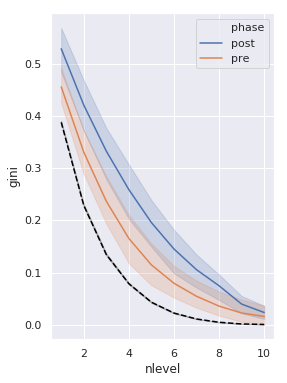

In [205]:
# compare agent, pre, and post

sns.set(rc={'figure.figsize':(4,6)})
ax1 = sns.lineplot(data=results, x='nlevel', y='gini', color='black', dashes=[(2, 2),(2,2)])
ax2 = sns.lineplot(data=results_h, x='nlevel', y='gini', hue='phase')
ax2.lines[0].set_linestyle("--")


In [215]:
both_results = results.append(results_h, sort=False, ignore_index=True)

In [216]:
both_results

,targetName,batch,gini,nlevel,phase,human
0,hand_selected_004,00c05086-9adc-11ea-a683-73923f43fcc7,0.255307,1.0,random agent,False
1,hand_selected_004,00c7b452-9adc-11ea-830b-654ada95d816,0.246523,1.0,random agent,False
2,hand_selected_004,00ce97fe-9adc-11ea-9496-cfbda28b0ffb,0.239997,1.0,random agent,False
3,hand_selected_004,00cf0eb4-9adc-11ea-86f7-a57f3b7e21b0,0.218191,1.0,random agent,False
4,hand_selected_004,00d80820-9adc-11ea-86ff-2312cb50f480,0.243544,1.0,random agent,False
5,hand_selected_004,00daaf12-9adc-11ea-b069-c90f58f31cb5,0.264026,1.0,random agent,False
6,hand_selected_004,00df6ebc-9adc-11ea-9449-f1df98583a12,0.213740,1.0,random agent,False
7,hand_selected_004,00df9180-9adc-11ea-ad2b-7129a43ca21c,0.249586,1.0,random agent,False
8,hand_selected_004,00e03572-9adc-11ea-b34d-0ba4476c4479,0.257874,1.0,random agent,False
9,hand_selected_004,00e04b02-9adc-11ea-94f7-7f330bbf6ca5,0.249563,1.0,random agent,False


In [217]:
# export for analysis and plotting in R

save_data = False

if save_data:
    out_path = os.path.join(csv_dir,'block_silhouette_{}_ngram_gini_final.csv'.format(iteration_name))
    both_results.to_csv(out_path)

In [218]:
pd.read_csv(out_path)

,Unnamed: 0,targetName,batch,gini,nlevel,phase,human
0,0,hand_selected_004,00c05086-9adc-11ea-a683-73923f43fcc7,0.255307,1.0,random agent,False
1,1,hand_selected_004,00c7b452-9adc-11ea-830b-654ada95d816,0.246523,1.0,random agent,False
2,2,hand_selected_004,00ce97fe-9adc-11ea-9496-cfbda28b0ffb,0.239997,1.0,random agent,False
3,3,hand_selected_004,00cf0eb4-9adc-11ea-86f7-a57f3b7e21b0,0.218191,1.0,random agent,False
4,4,hand_selected_004,00d80820-9adc-11ea-86ff-2312cb50f480,0.243544,1.0,random agent,False
5,5,hand_selected_004,00daaf12-9adc-11ea-b069-c90f58f31cb5,0.264026,1.0,random agent,False
6,6,hand_selected_004,00df6ebc-9adc-11ea-9449-f1df98583a12,0.213740,1.0,random agent,False
7,7,hand_selected_004,00df9180-9adc-11ea-ad2b-7129a43ca21c,0.249586,1.0,random agent,False
8,8,hand_selected_004,00e03572-9adc-11ea-b34d-0ba4476c4479,0.257874,1.0,random agent,False
9,9,hand_selected_004,00e04b02-9adc-11ea-94f7-7f330bbf6ca5,0.249563,1.0,random agent,False


In [ ]:
# 

In [266]:
h = results_h.groupby(['phase','nlevel'])['gini'].agg(np.mean).reset_index()
h

,phase,nlevel,gini
0,post,1.0,0.528783
1,post,2.0,0.420865
2,post,3.0,0.332624
3,post,4.0,0.258899
4,post,5.0,0.195728
5,post,6.0,0.145103
6,post,7.0,0.105425
7,post,8.0,0.074630
8,post,9.0,0.039567
9,post,10.0,0.023400


In [292]:
a = results.groupby(['batch','nlevel'])['gini'].agg(np.mean)
a
b = a.groupby('nlevel').agg([np.mean,np.std]).reset_index()
b

,nlevel,mean,std
0,1.0,0.387818,0.005852
1,2.0,0.228609,0.006022
2,3.0,0.134472,0.005284
3,4.0,0.078608,0.004333
4,5.0,0.043091,0.003376
5,6.0,0.022348,0.002561
6,7.0,0.010998,0.001877
7,8.0,0.004684,0.001289
8,9.0,0.001460,0.000799
9,10.0,0.000483,0.000490


In [278]:
b['pre'] = h[h.phase=='pre']['gini'].values
b['post'] = h[h.phase=='post']['gini'].values

b['z pre'] = (b['pre'] - b['mean'])/b['std']
b['z post'] = (b['post'] - b['mean'])/b['std']
b

,nlevel,mean,std,pre,post,z pre,z post
0,1.0,0.387818,0.005852,0.455859,0.528783,11.626954,24.088471
1,2.0,0.228609,0.006022,0.330657,0.420865,16.945315,31.924450
2,3.0,0.134472,0.005284,0.236591,0.332624,19.325578,37.499474
3,4.0,0.078608,0.004333,0.165298,0.258899,20.007447,41.609785
4,5.0,0.043091,0.003376,0.114639,0.195728,21.191580,45.208852
5,6.0,0.022348,0.002561,0.079465,0.145103,22.304782,47.937061
6,7.0,0.010998,0.001877,0.054486,0.105425,23.168732,50.307254
7,8.0,0.004684,0.001289,0.035631,0.074630,24.004447,54.253554
8,9.0,0.001460,0.000799,0.022460,0.039567,26.295429,47.717018
9,10.0,0.000483,0.000490,0.015831,0.023400,31.297941,46.733912


In [288]:
b.mean()

nlevel     5.500000
mean       0.091257
std        0.003188
pre        0.151092
post       0.212502
z pre     21.616820
z post    42.727983
dtype: float64

In [290]:
batches = np.sort(dfra['batch'].unique())
batches[0]

'00c05086-9adc-11ea-a683-73923f43fcc7'

In [297]:
a = results.groupby(['targetName','batch','nlevel'])['gini'].agg(np.mean)
a
b = a.groupby(['targetName','nlevel']).agg([np.mean,np.std]).reset_index()
b

,targetName,nlevel,mean,std
0,hand_selected_004,1.0,0.244228,0.014425
1,hand_selected_004,2.0,0.097376,0.012065
2,hand_selected_004,3.0,0.037619,0.008844
3,hand_selected_004,4.0,0.016540,0.006100
4,hand_selected_004,5.0,0.007135,0.004051
5,hand_selected_004,6.0,0.002708,0.002517
6,hand_selected_004,7.0,0.000953,0.001518
7,hand_selected_004,8.0,0.000264,0.000910
8,hand_selected_004,9.0,0.000091,0.000611
9,hand_selected_004,10.0,0.000036,0.000467


In [294]:
h = results_h.groupby(['targetName','phase','nlevel'])['gini'].agg(np.mean).reset_index()
h

,targetName,phase,nlevel,gini
0,hand_selected_004,post,1.0,0.513285
1,hand_selected_004,post,2.0,0.373867
2,hand_selected_004,post,3.0,0.256197
3,hand_selected_004,post,4.0,0.160931
4,hand_selected_004,post,5.0,0.085888
5,hand_selected_004,post,6.0,0.031817
6,hand_selected_004,post,7.0,0.011652
7,hand_selected_004,post,8.0,0.000000
8,hand_selected_004,post,9.0,0.000000
9,hand_selected_004,post,10.0,0.000000


In [298]:
b['pre'] = h[h.phase=='pre']['gini'].values
b['post'] = h[h.phase=='post']['gini'].values

b['z pre'] = (b['pre'] - b['mean'])/b['std']
b['z post'] = (b['post'] - b['mean'])/b['std']
b

,targetName,nlevel,mean,std,pre,post,z pre,z post
0,hand_selected_004,1.0,0.244228,0.014425,0.418926,0.513285,12.110980,18.652407
1,hand_selected_004,2.0,0.097376,0.012065,0.270496,0.373867,14.349206,22.917162
2,hand_selected_004,3.0,0.037619,0.008844,0.161381,0.256197,13.993690,24.714596
3,hand_selected_004,4.0,0.016540,0.006100,0.090680,0.160931,12.154066,23.670521
4,hand_selected_004,5.0,0.007135,0.004051,0.053436,0.085888,11.428834,19.439217
5,hand_selected_004,6.0,0.002708,0.002517,0.028519,0.031817,10.253847,11.563767
6,hand_selected_004,7.0,0.000953,0.001518,0.013835,0.011652,8.484024,7.046004
7,hand_selected_004,8.0,0.000264,0.000910,0.009477,0.000000,10.121926,-0.289513
8,hand_selected_004,9.0,0.000091,0.000611,0.006944,0.000000,11.218329,-0.149427
9,hand_selected_004,10.0,0.000036,0.000467,0.000000,0.000000,-0.078005,-0.078005


In [299]:
b[(b['z pre'] < 0 ) | (b['z post'] < 0 ) ]

,targetName,nlevel,mean,std,pre,post,z pre,z post
7,hand_selected_004,8.0,0.000264,0.000910,0.009477,0.000000,10.121926,-0.289513
8,hand_selected_004,9.0,0.000091,0.000611,0.006944,0.000000,11.218329,-0.149427
9,hand_selected_004,10.0,0.000036,0.000467,0.000000,0.000000,-0.078005,-0.078005
18,hand_selected_005,9.0,0.000399,0.001434,0.000000,0.000000,-0.277854,-0.277854
19,hand_selected_005,10.0,0.000173,0.001159,0.000000,0.000000,-0.149257,-0.149257
20,hand_selected_006,1.0,0.495281,0.015731,0.393528,0.420813,-6.468126,-4.733693
21,hand_selected_006,2.0,0.322856,0.019214,0.265582,0.308752,-2.980860,-0.734034
22,hand_selected_006,3.0,0.190767,0.018047,0.165409,0.217912,-1.405082,1.504160
23,hand_selected_006,4.0,0.104135,0.014698,0.088977,0.148458,-1.031323,3.015656
38,hand_selected_008,9.0,0.000351,0.001217,0.000000,0.061931,-0.288833,50.614847
